In [1]:
from __future__ import division
import torch
from torch.utils import data

import torch.nn.functional as F

# general libs
import numpy as np
import tqdm
import matplotlib.pyplot as plt


### My libs
from machine_perception.models.stm.model import STM, load_stm_state_dict
from machine_perception.datasets.stm_dataset import MoseStmDataset

KeyboardInterrupt: 

In [ ]:
DATA_ROOT = (
    R"D:\Documents\University\MSc\Sem1\MachinePerception\machine-perception\data"
)
WEIGHTS_PATH = R"D:\Documents\University\MSc\Sem1\MachinePerception\machine-perception\resources\stm\STM_weights.pth"

print(f"{torch.cuda.is_available() = }")

torch.cuda.is_available() = False


In [ ]:
def Run_video(
    model: STM,
    Fs: torch.Tensor,
    Ms: torch.Tensor,
    num_frames: int,
    num_objects: int,
    Mem_every: int | None = None,
    Mem_number: int | None = None,
    device: str = "cpu",
):
    # initialize storage tensors
    if Mem_every:
        to_memorize = [int(i) for i in np.arange(0, num_frames, step=Mem_every)]
    elif Mem_number:
        to_memorize = [
            int(round(i)) for i in np.linspace(0, num_frames, num=Mem_number + 2)[:-1]
        ]
    else:
        raise NotImplementedError

    Es = torch.zeros_like(Ms)
    Es[:, :, 0] = Ms[:, :, 0]

    Fs = Fs.to(device)
    Es = Es.to(device)
    num_objects_t = torch.tensor([num_objects], device=device)

    keys, values = None, None
    for t in tqdm.tqdm(range(1, num_frames)):
        # memorize
        with torch.no_grad():
            prev_key, prev_value = model(
                Fs[:, :, t - 1], Es[:, :, t - 1], num_objects_t
            )

        if keys is None or values is None:
            this_keys, this_values = prev_key, prev_value  # only prev memory
        else:
            this_keys = torch.cat([keys, prev_key], dim=3)
            this_values = torch.cat([values, prev_value], dim=3)

        # segment
        with torch.no_grad():
            # this_keys = this_keys.to(device)
            # this_values = this_values.to(device)
            logit = model(Fs[:, :, t], this_keys, this_values, num_objects_t)
        Es[:, :, t] = F.softmax(logit, dim=1)

        # update
        if t - 1 in to_memorize:
            keys, values = this_keys, this_values

    pred = np.argmax(Es[0].cpu().numpy(), axis=0).astype(np.uint8)

    return pred, Es

In [ ]:
dataset_test = MoseStmDataset(
    DATA_ROOT,
    imset="meta_train_split.json",
    single_object=False,
)
dataloader_test = data.DataLoader(
    dataset_test, batch_size=1, shuffle=True, num_workers=0, pin_memory=True
)

In [ ]:
len(dataset_test)

In [36]:
model = STM()
model.eval()  # turn-off BN

print("Loading weights:", WEIGHTS_PATH)
model.load_state_dict(load_stm_state_dict(WEIGHTS_PATH))
if torch.cuda.is_available():
    model.cuda()
elif torch.backends.mps.is_available():
    model.to("mps")

/Users/andrejkartavik/miniconda3/envs/mp/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/andrejkartavik/miniconda3/envs/mp/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading weights: /Users/andrejkartavik/Desktop/university/master/semester1/MP/machine-perception/src/machine_perception/experiments/stm/STM_weights.pth


In [37]:
# for seq, V in enumerate(dataloader_test):
#     Fs, Ms, num_objects, info = V
#     seq_name = info["name"][0]
#     num_frames = info["num_frames"][0].item()
#     print(
#         "[{}]: num_frames: {}, num_objects: {}".format(
#             seq_name, num_frames, num_objects[0][0]
#         )
#     )

#     pred, Es = Run_video(Fs, Ms, num_frames, num_objects, Mem_every=5, Mem_number=None)
#     pass

# Save results for quantitative eval ######################
# test_path = os.path.join("./test", code_name, seq_name)
# if not os.path.exists(test_path):
#     os.makedirs(test_path)
# for f in range(num_frames):
#     img_E = Image.fromarray(pred[f])
#     img_E.putpalette(PALETTE)
#     img_E.save(os.path.join(test_path, "{:05d}.png".format(f)))

In [ ]:
def show_preds(Fs: torch.Tensor, pred: np.ndarray, show_every: int = 1):
    frames_np = Fs.cpu().numpy()[0].transpose(1, 2, 3, 0)
    n_frames = frames_np.shape[0]

    n_frames_indexes = list(range(0, n_frames, show_every))
    n_frames_to_show = len(n_frames_indexes)
    fig, axs = plt.subplots(n_frames_to_show, 1, figsize=(10, 4 * n_frames_to_show))

    for i, idx in enumerate(n_frames_indexes):
        axs[i].imshow(frames_np[idx])
        axs[i].imshow(pred[idx], alpha=0.5)

In [ ]:
idx = 3
Fs, Ms, num_objects, info = dataset_test[idx]
Fs = Fs.unsqueeze(dim=0)
Ms = Ms.unsqueeze(dim=0)
seq_name = info["name"]
num_frames = info["num_frames"]
pred, Es = Run_video(Fs, Ms, num_frames, num_objects, Mem_every=5, Mem_number=None)

100%|██████████| 81/81 [00:40<00:00,  2.00it/s]


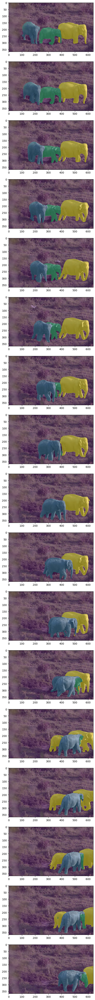

In [48]:
show_preds(Fs, pred, 5)

In [ ]:
idx = 16
Fs, Ms, num_objects, info = dataset_test[idx]
Fs = Fs.unsqueeze(dim=0)
Ms = Ms.unsqueeze(dim=0)
seq_name = info["name"]
num_frames = info["num_frames"]
pred, Es = Run_video(Fs, Ms, num_frames, num_objects, Mem_every=5, Mem_number=None)

100%|██████████| 40/40 [07:00<00:00, 10.52s/it]


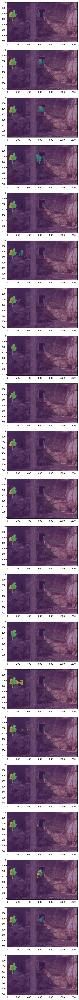

In [43]:
show_preds(Fs, pred, 2)